In [1]:
import torch
import matplotlib.pyplot as plt
from torch import optim, distributions, nn
from tqdm.notebook import tqdm
import gpzoo
from gpzoo.kernels import NSF_RBF, batched_RBF, batched_MGGP_RBF
from gpzoo.gp import GaussianPrior, SVGP, MGGP_VNNGP, MGGP_WSVGP
from gpzoo.likelihoods import PNMF, NSF2, Hybrid_NSF2
from gpzoo.utilities import  whitened_KL, train_hybrid, train_hybrid_batched, anndata_to_train_val, plot_factors, rescale_spatial_coords, add_jitter, init_softplus
import squidpy as sq
import numpy as np
from sklearn.decomposition import NMF
import scanpy as sc
import random

from gpzoo.utilities import regularized_nmf, dims_autocorr
from matplotlib.animation import FuncAnimation
from matplotlib import animation
import pickle
from sklearn.cluster import KMeans

import matplotlib.patheffects as path_effects
import gc

/gladstone/engelhardt/home/lchumpitaz/gitclones/GPzoo/gpzoo/utilities.py:2: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
def plot_factors(factors, X, moran_idx=None, ax=None, size=7, alpha=0.8, s=0.1, names=None, vmin=None, vmax=None, cmap='turbo'):
    # If vmin/vmax not provided, infer from percentiles
    if vmin is None:
        vmin = np.percentile(factors, 1)
    if vmax is None:
        vmax = np.percentile(factors, 99)

    if moran_idx is not None:
        factors = factors[moran_idx]
        if names is not None:
            names = names[moran_idx]

    L = len(factors)

    if ax is None:
        fig, ax = plt.subplots(2, 6, figsize=(size*6, size*2), tight_layout=True)

    for i in range(L):
        curr_ax = ax[i // 6, i % 6]

        curr_ax.scatter(
            X[:, 0], X[:, 1],
            c=factors[i],
            vmin=vmin,
            vmax=vmax,
            alpha=alpha,
            cmap=cmap,
            s=s
        )

        curr_ax.invert_yaxis()

        if names is not None:
            curr_ax.set_title(
                names[i],
                x=0.03, y=0.88,
                fontsize="small",
                color="white",
                ha="left", va="top"
            )

        curr_ax.set_xticks([])
        curr_ax.set_yticks([])
        curr_ax.set_facecolor('xkcd:gray')


In [3]:
adata = sq.datasets.slideseqv2()
adata = adata.raw.to_adata()

<Axes: >

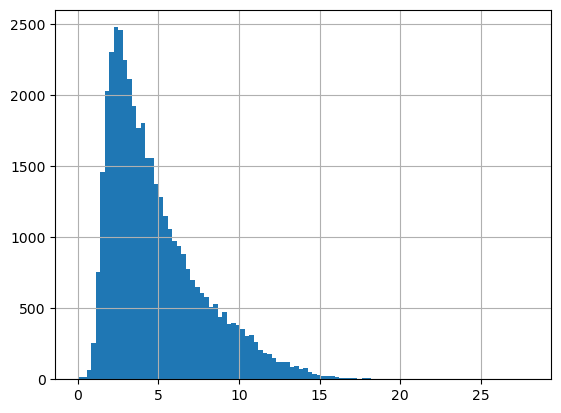

In [4]:
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
adata.obs.pct_counts_mt.hist(bins=100)


In [5]:
adata = adata[adata.obs.pct_counts_mt < 20] #from 53K to 45K
sc.pp.filter_cells(adata, min_counts=100)#was 100
sc.pp.filter_genes(adata, min_cells=10)# was 10

/gladstone/engelhardt/home/lchumpitaz/miniconda3/envs/gpzoo/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:158: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["n_counts"] = number


In [6]:
Dtr, Dval = anndata_to_train_val(adata, sz="scanpy")

In [7]:
Y = Dtr['Y'].T
Y = Y[~adata.var.MT]
X = Dtr['X']*50
V = Dtr['sz']

In [8]:
X = torch.tensor(X).type(torch.float)
Y = torch.tensor(Y).type(torch.float)
groupsX = torch.tensor(adata[Dtr['idx']].obs.cluster.values.codes).type(torch.LongTensor)
n_groups = len(adata.obs.cluster.values.categories)

In [9]:
D, N = Y.shape

In [10]:
M = N
L = 12
K=50

Z = nn.Parameter(torch.tensor(X).type(torch.float), requires_grad=False)
groupsZ = nn.Parameter(torch.tensor(groupsX).type(torch.LongTensor), requires_grad=False)
kernel = batched_MGGP_RBF(sigma=1.0, lengthscale=2.0, group_diff_param=10.0, n_groups=n_groups)
gp = MGGP_VNNGP(kernel, M=M, n_groups=n_groups, jitter=1e-5, K=K)
mu = torch.randn(L, M)
gp.mu = nn.Parameter(mu)
Lu = 1e-2*torch.randn(L, M, K)
gp.Lu = nn.Parameter(Lu.clone().detach())

gp.Z = Z
gp.groupsZ = groupsZ
model = NSF2(gp, Y, L=L)
W = torch.randn(D, L) 
model.W = nn.Parameter(W)
model.V = nn.Parameter(torch.squeeze(torch.tensor(init_softplus(V)).type(torch.float))) 


/tmp/ipykernel_1152433/745074725.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Z = nn.Parameter(torch.tensor(X).type(torch.float), requires_grad=False)
/tmp/ipykernel_1152433/745074725.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  groupsZ = nn.Parameter(torch.tensor(groupsX).type(torch.LongTensor), requires_grad=False)


In [11]:
model.load_state_dict(torch.load('../models/slideseqv2_vnngp_mggp.pth'))

<All keys matched successfully>

In [12]:
model.cpu()
model.prior.K = 50

knn_idx = model.prior.calculate_knn(X)[:, :-1]
model.prior.knn_idx = knn_idx
knn_idz = model.prior.calculate_knn(model.prior.Z)[:, 1:]
model.prior.knn_idz = knn_idz


qF, _, _ = model.prior.forward(X=X, groupsX=groupsX, verbose=True)
mean = torch.exp(qF.mean).detach().numpy()
scale = qF.scale.detach().numpy()

→ Computing kernels
→kernels computed
applying constraints
done with constraints
adding jitter to Kzz
done with jitter
computing little Lu
Lu_knn shape: torch.Size([12, 39694, 50, 50])
Lu.shape: torch.Size([12, 39694, 50, 50])
Reshaped mu: torch.Size([12, 39694, 50])
Reshaped Lu: torch.Size([12, 39694, 50, 50])
Reshaped Kzx: torch.Size([39694, 50, 1])
Reshaped Kzz: torch.Size([39694, 50, 50])
Reshaped Kxx: torch.Size([39694, 1])
→ Cholesky(Kzz)
→ Solving for W
W shape: torch.Size([39694, 1, 50])
Lu lower_cholesky: tensor(True)
mu shape: torch.Size([12, 39694, 50])
Lu shape: torch.Size([12, 39694, 50, 50])
L shape: torch.Size([39694, 50, 50])
Lu lower_cholesky: tensor(True)
→ Computing mean
→ Mean shape: torch.Size([12, 39694, 1])
→ Diagonal covariance
cov_diag shape: torch.Size([39694, 1])
cov_diag shape: torch.Size([39694, 1])
cov_diag shape: torch.Size([12, 39694, 1])


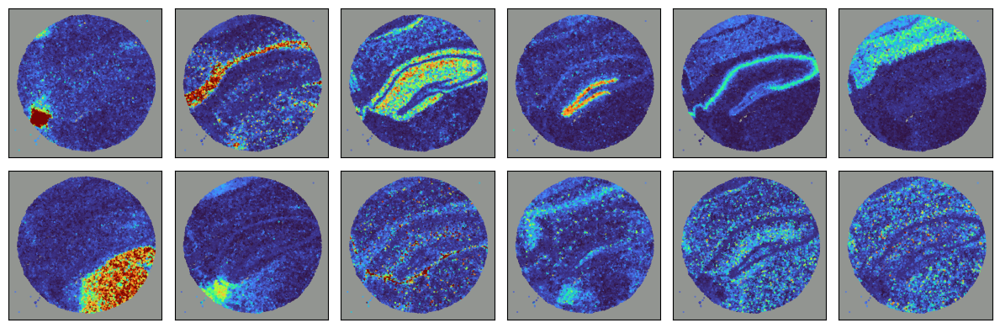

In [13]:
plot_factors(mean, X, moran_idx=None, ax=None, size=2, alpha=0.9, s=0.2, vmin=0.0, vmax=np.percentile(mean, 99))


In [43]:
loadings = torch.nn.functional.softplus(model.W).detach().cpu()

In [44]:
loadings

tensor([[1.5042e-05, 2.4651e-05, 1.7854e-04,  ..., 9.5351e-05, 4.8300e-06,
         4.5932e-09],
        [8.0388e-04, 5.7079e-03, 1.6859e-07,  ..., 3.2503e-03, 4.1605e-03,
         3.7204e-03],
        [9.1124e-04, 2.7838e-03, 1.5368e-08,  ..., 3.4968e-03, 6.3805e-03,
         1.6996e-03],
        ...,
        [2.3566e-03, 3.5281e-03, 1.5369e-03,  ..., 1.0097e-02, 8.8710e-03,
         5.9104e-08],
        [5.9253e-04, 9.6332e-04, 2.9753e-03,  ..., 1.2222e-04, 1.1015e-08,
         1.4410e-08],
        [3.2387e-04, 9.3987e-08, 1.8102e-09,  ..., 5.2658e-08, 9.4599e-11,
         7.3286e-10]])

In [45]:
mean

array([[0.1294326 , 0.11754761, 0.12265791, ..., 0.18011118, 1.5309722 ,
        0.14599478],
       [0.11939414, 0.30333847, 0.11281487, ..., 1.4623381 , 0.01508505,
        0.14167738],
       [0.09002644, 0.05261949, 0.09722944, ..., 0.07334068, 0.9903894 ,
        0.8839104 ],
       ...,
       [0.65807855, 0.11501025, 0.615056  , ..., 0.07742997, 0.09881455,
        0.26812285],
       [0.17121519, 0.18724756, 0.17265145, ..., 0.47157025, 0.03488626,
        0.2508076 ],
       [0.2718107 , 0.21247473, 0.31200352, ..., 0.34815803, 0.25006863,
        0.17272873]], dtype=float32)

In [46]:
reconstruct = loadings@mean

In [47]:
reconstruct

tensor([[9.8112e-05, 8.9128e-05, 9.3305e-05,  ..., 7.0739e-05, 2.1248e-04,
         1.9955e-04],
        [1.0285e-02, 1.3298e-02, 9.7477e-03,  ..., 1.4788e-02, 1.0741e-02,
         8.5317e-03],
        [6.9327e-03, 8.4966e-03, 6.5942e-03,  ..., 9.7131e-03, 6.8957e-03,
         6.0871e-03],
        ...,
        [1.8310e-02, 1.5066e-02, 1.7049e-02,  ..., 1.4646e-02, 1.6296e-02,
         1.2735e-02],
        [1.6024e-03, 2.9594e-03, 1.5148e-03,  ..., 2.4572e-03, 4.7735e-03,
         4.0120e-03],
        [4.6340e-04, 8.3796e-04, 4.2748e-04,  ..., 1.2408e-04, 5.8699e-04,
         4.1814e-04]])

In [48]:
loadings

tensor([[1.5042e-05, 2.4651e-05, 1.7854e-04,  ..., 9.5351e-05, 4.8300e-06,
         4.5932e-09],
        [8.0388e-04, 5.7079e-03, 1.6859e-07,  ..., 3.2503e-03, 4.1605e-03,
         3.7204e-03],
        [9.1124e-04, 2.7838e-03, 1.5368e-08,  ..., 3.4968e-03, 6.3805e-03,
         1.6996e-03],
        ...,
        [2.3566e-03, 3.5281e-03, 1.5369e-03,  ..., 1.0097e-02, 8.8710e-03,
         5.9104e-08],
        [5.9253e-04, 9.6332e-04, 2.9753e-03,  ..., 1.2222e-04, 1.1015e-08,
         1.4410e-08],
        [3.2387e-04, 9.3987e-08, 1.8102e-09,  ..., 5.2658e-08, 9.4599e-11,
         7.3286e-10]])

In [51]:
def plot_top_genes(factors, loadings, X, Y, num_genes=5, size=2, alpha=0.8, s=0.1, names=None):
    max_val_factors = np.percentile(factors, 99)
    min_val_factors = np.percentile(factors, 1)

    L = len(factors)

    # Normalize loadings across factors (row-wise: sum over factors per gene)
    loadings_normalized = (loadings / loadings.sum(dim=1, keepdim=True)).clone()


    # Mask out genes with low total expression
    gene_total = loadings.sum(dim=1)
    threshold = torch.quantile(gene_total, 0.5)
    valid_genes_mask = gene_total > threshold

    # Prevent low-expression genes from being selected
    loadings_normalized[~valid_genes_mask] = -float('inf')

    # Sort genes by highest normalized loading per factor
    order = torch.argsort(loadings_normalized, dim=0, descending=True)

    fig, ax = plt.subplots(L, num_genes+1, figsize=(size*(num_genes+1), size*L), tight_layout=True)

    for i in range(L):
        curr_ax = ax[i, 0]
        curr_ax.scatter(X[:, 0], X[:, 1], c=factors[i],
                        vmin=min_val_factors, vmax=max_val_factors,
                        alpha=alpha, cmap='turbo', s=s)
        curr_ax.invert_yaxis()
        curr_ax.set_xticks([])
        curr_ax.set_yticks([])
        curr_ax.set_facecolor('xkcd:gray')

        top_gene_indices = order[:num_genes, i]
        top_gene_names = adata.var.index[top_gene_indices.cpu().numpy()]

        for j in range(num_genes):
            gene_idx = top_gene_indices[j].item()
            gene_name = top_gene_names[j]
            gene_sum = gene_total[gene_idx].item()
            gene_loading = loadings_normalized[gene_idx, i].item()

            gene_expression = Y[gene_idx].cpu().numpy()

            nonzero = gene_expression[gene_expression > 0]

            vmin = 0
            vmax = np.percentile(nonzero, 99)

            marker_sizes = np.full_like(gene_expression, fill_value=s)
            marker_sizes[gene_expression > 0] = 5 * s

            curr_ax = ax[i, j+1]
            curr_ax.scatter(X[:, 0], X[:, 1], c=gene_expression,
                            alpha=alpha, cmap='turbo', s=marker_sizes, vmin=vmin, vmax=vmax)
            curr_ax.invert_yaxis()
            curr_ax.set_xticks([])
            curr_ax.set_yticks([])
            curr_ax.set_facecolor('xkcd:gray')

            title_text = curr_ax.set_title(
                f"{gene_name}    Loading: {gene_loading:.2f}",
                x=0.03, y=0.88, fontsize="medium", c="white",
                ha="left", va="top"
            )
            title_text.set_path_effects([
                path_effects.Stroke(linewidth=2, foreground='black'),
                path_effects.Normal()
            ])


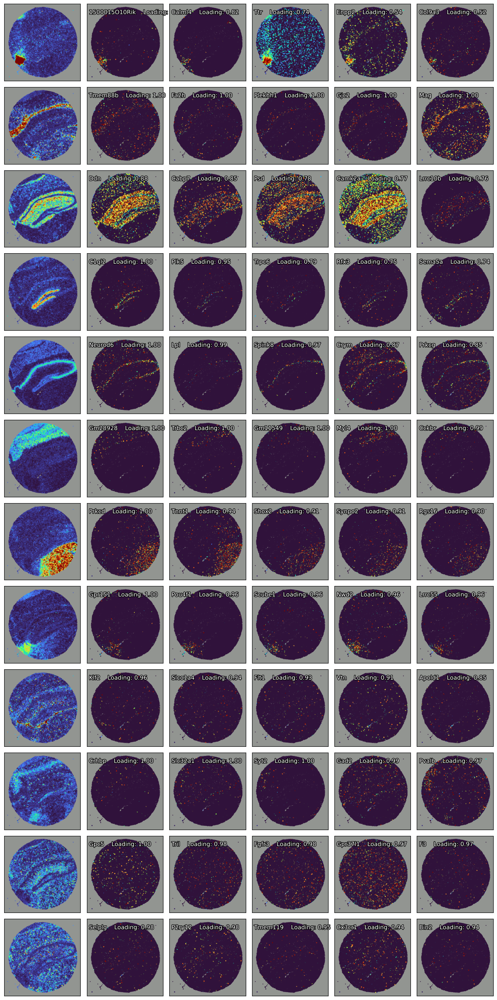

In [52]:
plot_top_genes(mean, loadings, X, Y, size=2, alpha=0.9, s=0.2, num_genes=5)

In [56]:
all_factors = []
with torch.no_grad():
    rows = adata.obs.cluster.values.categories.to_list()
    n_groups = len(rows)

    # Get spatial coordinates and scale
    # X_test = torch.tensor(rescale_spatial_coords(adata.obsm['spatial'])).float() * 50
    # cluster_codes = torch.tensor(adata.obs.cluster.values.codes).long()
    X_test = X
    cluster_codes = groupsX


    knn_idx = model.prior.calculate_knn(X_test)
    model.prior.knn_idx = knn_idx[:, :-1]


    for group_index in tqdm(range(n_groups)):
        group_name = rows[group_index]
        group_mask = (cluster_codes == group_index)

        # Set group context
        groupsX_test = torch.full_like(cluster_codes, fill_value=group_index)

        # Get factor samples
        qF_test, _, _ = model.prior(X_test, groupsX=groupsX_test)
        factors_test = torch.exp(qF_test.mean).cpu().numpy()
        all_factors.append(factors_test)

  0%|          | 0/14 [00:00<?, ?it/s]

In [58]:
all_factors

[array([[0.21038432, 0.14590734, 0.14500389, ..., 0.8237315 , 0.91239256,
         0.06273925],
        [0.16204232, 0.21405765, 0.10557389, ..., 1.1770186 , 0.08839893,
         0.08620853],
        [0.5556994 , 0.1062079 , 0.3941509 , ..., 0.01368301, 1.0098658 ,
         0.9329628 ],
        ...,
        [0.31686065, 0.11253954, 0.33185259, ..., 0.32531875, 0.11642718,
         0.135893  ],
        [0.3970303 , 0.44212353, 0.6062726 , ..., 0.7599995 , 0.19204158,
         0.682006  ],
        [0.7587725 , 0.23888029, 0.7403981 , ..., 0.17477772, 0.13972303,
         0.27395558]], dtype=float32),
 array([[0.1107111 , 0.11754761, 0.14630711, ..., 0.3256574 , 0.3269551 ,
         0.08041521],
        [0.099163  , 0.30333847, 0.12645537, ..., 1.4167802 , 0.07922126,
         0.17745714],
        [0.3162105 , 0.05261949, 0.4433892 , ..., 0.12532847, 0.35578534,
         1.419548  ],
        ...,
        [0.18721925, 0.11501025, 0.2279264 , ..., 0.16962965, 0.09131134,
         0.03823109

In [59]:
all_reconstructions = []
for factors in all_factors:
    all_reconstructions.append(loadings@factors)

In [60]:
all_reconstructions

[tensor([[1.6124e-04, 5.0258e-05, 1.2615e-04,  ..., 8.1149e-05, 2.1671e-04,
          2.0222e-04],
         [1.2746e-02, 1.1279e-02, 1.2587e-02,  ..., 1.3045e-02, 1.2327e-02,
          8.9578e-03],
         [8.2489e-03, 8.1799e-03, 8.9096e-03,  ..., 1.0711e-02, 7.9614e-03,
          7.7550e-03],
         ...,
         [1.6072e-02, 1.3887e-02, 1.6594e-02,  ..., 1.7179e-02, 1.7728e-02,
          1.4363e-02],
         [3.6085e-03, 2.2896e-03, 2.9178e-03,  ..., 1.9285e-03, 5.0839e-03,
          3.7711e-03],
         [2.7572e-04, 7.6223e-04, 2.1706e-04,  ..., 2.8106e-04, 4.4415e-04,
          1.9561e-04]]),
 tensor([[1.0715e-04, 8.9128e-05, 1.3518e-04,  ..., 1.0208e-04, 8.9222e-05,
          2.6499e-04],
         [1.0200e-02, 1.3298e-02, 1.1086e-02,  ..., 1.6293e-02, 1.5418e-02,
          7.6116e-03],
         [6.5969e-03, 8.4966e-03, 7.8886e-03,  ..., 9.7110e-03, 8.7753e-03,
          4.3651e-03],
         ...,
         [1.5460e-02, 1.5066e-02, 1.6492e-02,  ..., 1.6714e-02, 1.8735e-02,
   

In [63]:
diff_reconstructions = []
for curr_reconstruction in all_reconstructions:
    diff_reconstructions.append(reconstruct-curr_reconstruction)

In [66]:
diff_reconstructions = torch.stack(diff_reconstructions, dim=0)

In [67]:
diff_reconstructions.shape

torch.Size([14, 17702, 39694])

In [69]:
diff_squared_sum = torch.sum(diff_reconstructions**2, dim=-1)

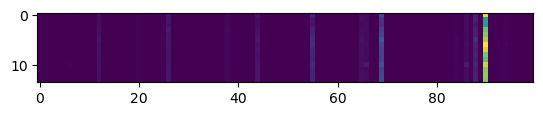

In [86]:
plt.imshow(diff_squared_sum[:,700:800])

In [104]:
diff_squared_sum.sort(dim=-1)[0]

tensor([[1.5659e-05, 1.6269e-05, 1.6521e-05,  ..., 1.5376e+04, 1.5578e+04,
         1.7467e+04],
        [1.0806e-05, 1.1020e-05, 1.1932e-05,  ..., 7.3527e+03, 7.9059e+03,
         1.6338e+04],
        [9.6697e-06, 9.6897e-06, 1.0831e-05,  ..., 6.5926e+03, 6.6789e+03,
         1.6794e+04],
        ...,
        [1.2282e-05, 1.3212e-05, 1.3785e-05,  ..., 8.7227e+03, 9.3140e+03,
         1.5068e+04],
        [1.1735e-05, 1.3186e-05, 1.4293e-05,  ..., 9.3354e+03, 9.4843e+03,
         1.6790e+04],
        [1.2163e-05, 1.3572e-05, 1.4871e-05,  ..., 9.0393e+03, 9.6611e+03,
         1.7658e+04]])

In [105]:
torch.argsort(diff_squared_sum, dim=1, descending=True)[:,:10]

tensor([[11888,  1659,  3863,  5750,  1417, 16418, 14884,  9699,  9537,  2643],
        [11888,  5750,  3863, 16418,  1659,  2643,  9699,  9537, 12434,  1417],
        [11888,  3863,  5750, 16418,  1659,  9699,  9537,  2643, 12434,  1417],
        [11888,  5750,  3863,  1659,  9699,  9537,  2643, 12434,  1417, 14884],
        [11888,  5750,  3863,  1659,  9699,  9537,  2643,  1417, 14884, 12434],
        [11888,  5750,  3863,  1659,  9537,  9699,  2643,  1417, 12434, 14884],
        [11888,  5750,  3863,  1659,  2643, 16418,  9699,  9537,  1417, 14330],
        [11888,  5750,  3863,  1659,  9699,  9537,  2643, 16418,  8927,  1417],
        [11888,  5750,  3863,  1659,  9699,  9537,  2643, 16418,  1417, 12434],
        [11888,  5750,  3863, 16418,  1659,  9699,  9537,  2643, 12434,  1417],
        [11888,  5750,  9699,  3863,  1659,  9537, 16418,  2643, 12434, 10023],
        [11888,  5750,  3863,  1659, 16418,  9537,  9699,  2643, 12434,  1417],
        [11888,  5750,  3863,  1659, 164

In [106]:
def plot_groupwise_reconstructions(diff_squared_sum, L=12, size=2, s=0.2, alpha=0.9, vmin=0, vmax=2.0):


    with torch.no_grad():
        cols = [f"Factor {i}" for i in range(1, L + 1)]
        rows = adata.obs.cluster.values.categories.to_list()
        n_groups = len(rows)

        # Get spatial coordinates and scale
        # X_test = torch.tensor(rescale_spatial_coords(adata.obsm['spatial'])).float() * 50
        # cluster_codes = torch.tensor(adata.obs.cluster.values.codes).long()
        X_test = X
        cluster_codes = groupsX

        # Color scaling based on global factor range
        min_val = vmin
        max_val = vmax

        fig, axes = plt.subplots(nrows=n_groups, ncols=L + 1,
                                 figsize=(size * (L + 1), size * n_groups))

        order = torch.argsort(diff_squared_sum, dim=1, descending=True)[:,:L]
        

        for group_index in tqdm(range(n_groups)):
            group_name = rows[group_index]
            group_mask = (cluster_codes == group_index)

            

            # Cell identity grayscale overlay
            cell_fake_factor = np.full_like(factors_test[0], fill_value=0.0)
            cell_fake_factor[group_mask.numpy()] = 1.0

            axes[group_index, 0].scatter(X_test[:, 0], X_test[:, 1],
                                         c=cell_fake_factor,
                                         vmin=0.0, vmax=1.0,
                                         alpha=alpha, s=s, cmap='gray')
            axes[group_index, 0].invert_yaxis()
            axes[group_index, 0].set(xticks=[], yticks=[])

            for i in range(L):

                gene_expression = Y[order[group_index,i ]].cpu().numpy()

                
                axes[group_index, i + 1].scatter(X_test[:, 0], X_test[:, 1],
                                                 c=gene_expression,
                                                 alpha=alpha, s=s, cmap='turbo')
                axes[group_index, i + 1].invert_yaxis()
                axes[group_index, i + 1].set(xticks=[], yticks=[])

        # Set column titles
        for ax, col in zip(axes[0, 1:], cols):
            ax.set_title(col, fontsize=10)

        # Set row labels (first 2 tokens of cluster name)
        for ax, row_name in zip(axes[:, 0], rows):
            display_name = ' '.join(row_name.split('_')[:2])
            ax.set_ylabel(display_name, rotation=0, fontsize=10, labelpad=80)

        fig.tight_layout()
        plt.show()

  0%|          | 0/14 [00:00<?, ?it/s]

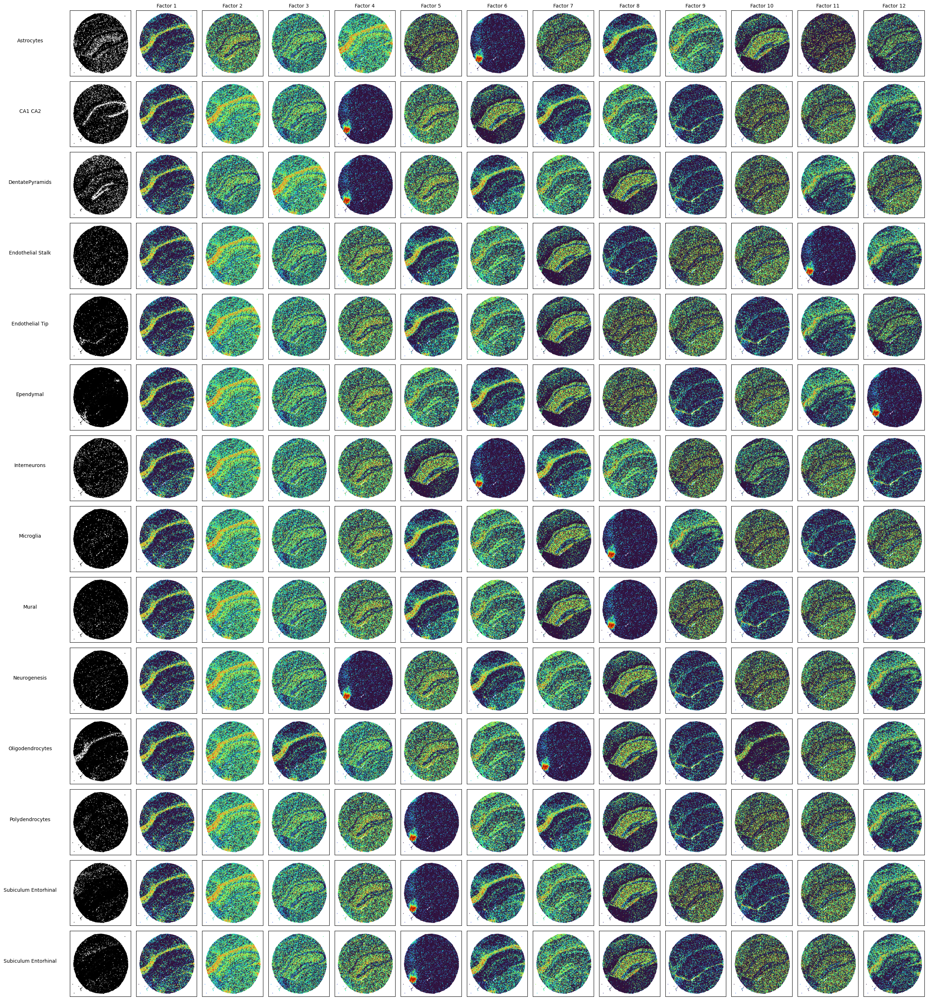

In [107]:
plot_groupwise_reconstructions(diff_squared_sum, L=12, size=2, s=0.2, alpha=0.9, vmin=0, vmax=2.0)